In [78]:
import cv2
import numpy as np

from matplotlib import pyplot as plt

# from PIL import Image
# from skimage import io
# from skimage.util import img_as_ubyte
# from google.colab.patches import cv2_imshow



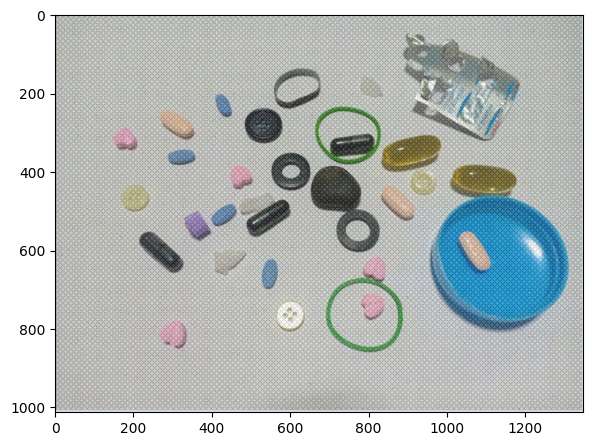

In [79]:
org_img = cv2.imread("noise.jpg")
rgb = cv2.cvtColor(org_img, cv2.COLOR_BGR2RGB)
# r,g,b = cv2.split(org_img)
# R = rgb[:,:,0]
# G = rgb[:,:,1]
# B = rgb[:,:,2]

fig=plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(rgb ,'gray')

In [80]:
def notched_rejected(shape,d0,u_k,v_k):
    M,N=shape
    H=np.zeros((M,N))

    for u in range(0,M):
        for v in range(0,N):

            D_uv=np.sqrt((u-M/2+u_k)**2+(v-N/2+v_k)**2)
            D_muv=np.sqrt((u-M/2-u_k)**2+(v-N/2-v_k)**2)

            if(D_uv< d0 or D_muv < d0):
                H[u,v]=0.0
            else:
                H[u,v]=1.0
    return H

In [81]:
import copy
def median_filter(input_img,k_size):
    row,col=input_img.shape
    output_img=copy.deepcopy(input_img)
    start=int(np.ceil(k_size/2)) #if k_size=5 start=3
    offset=k_size-start # offset 5-3 =2
    for i in range(start,row-offset):
        for j in range(start,col-offset):
            #i-offset=3-2=1,i+offset=3+2=5 [1:5] 
            v=input_img[i-offset:i+offset,j-offset:j+offset]
            #v= [1,2,8,3,7]
            output_img[i-offset,j-offset]=np.median(v)
    
    return output_img

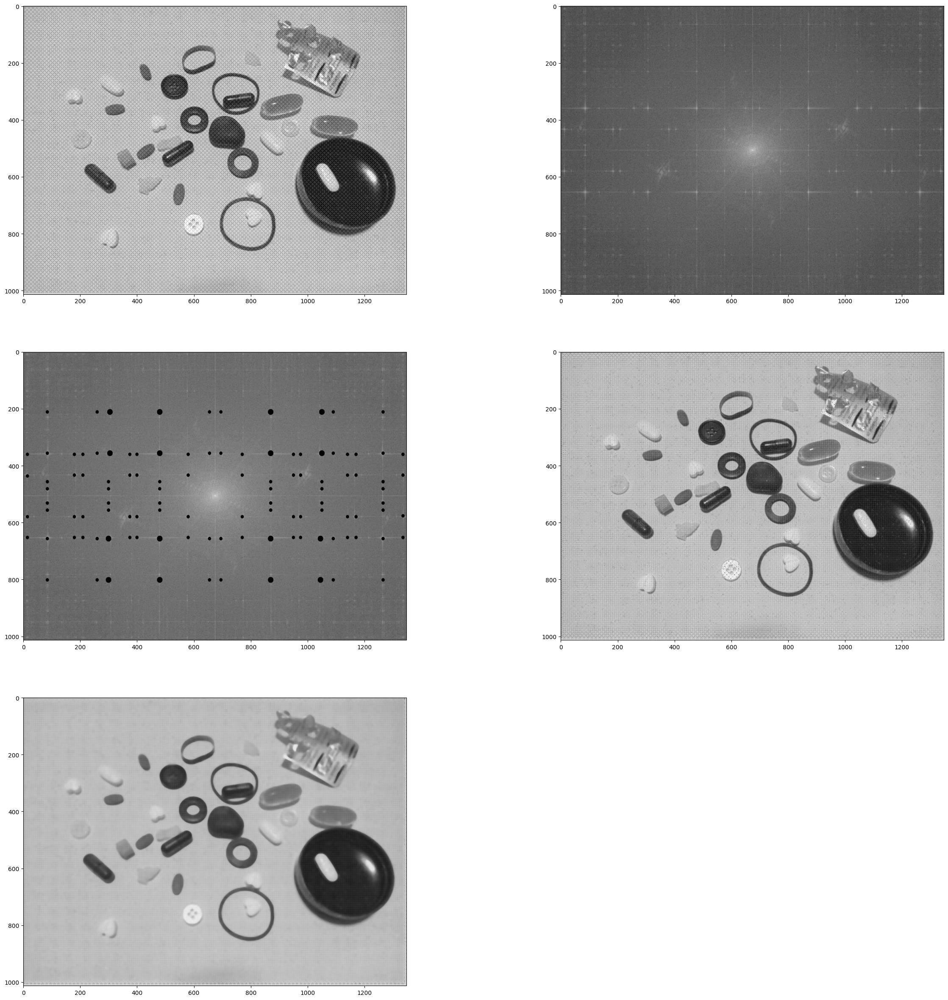

In [82]:
R = rgb[:,:,0]
f=np.fft.fft2(R)
fshift=np.fft.fftshift(f)
magnitude_spectrum=20*np.log(abs(fshift))
# ################################

# ################################
Rx=R.shape

H1=notched_rejected(Rx,10,150,195)
H2=notched_rejected(Rx,10,150,-195)
H3=notched_rejected(Rx,10,150,370)
H4=notched_rejected(Rx,10,150,-375)
H5=notched_rejected(Rx,6,150,415)
H6=notched_rejected(Rx,6,150,-415)
H7=notched_rejected(Rx,6,150,590)
H8=notched_rejected(Rx,6,150,-590)
H9=notched_rejected(Rx,6,70,660)
H10=notched_rejected(Rx,6,73,-660)
H11=notched_rejected(Rx,6,73,95)
H12=notched_rejected(Rx,6,73,-95)
H13=notched_rejected(Rx,6,73,300)
H14=notched_rejected(Rx,6,73,-300)
H15=notched_rejected(Rx,6,73,495)
H16=notched_rejected(Rx,6,73,-495)
H17=notched_rejected(Rx,6,73,465)
H18=notched_rejected(Rx,6,73,-465)
H19=notched_rejected(Rx,6,150,20)
H20=notched_rejected(Rx,6,150,-20)
H21=notched_rejected(Rx,6,73,275)
H22=notched_rejected(Rx,6,73,-275)
H23=notched_rejected(Rx,6,25,590)
H24=notched_rejected(Rx,6,25,-590)
H25=notched_rejected(Rx,6,25,195)
H26=notched_rejected(Rx,6,25,-195)
H27=notched_rejected(Rx,6,25,375)
H28=notched_rejected(Rx,6,25,-375)
###################################
H29=notched_rejected(Rx,10,295,195)
H30=notched_rejected(Rx,10,295,-195)
H31=notched_rejected(Rx,10,295,370)
H32=notched_rejected(Rx,10,295,-375)
H33=notched_rejected(Rx,6,295,415)
H34=notched_rejected(Rx,6,295,-415)
H35=notched_rejected(Rx,6,295,590)
H36=notched_rejected(Rx,6,295,-590)
H37=notched_rejected(Rx,6,146,660)
H38=notched_rejected(Rx,6,146,-660)
H39=notched_rejected(Rx,6,146,95)
H40=notched_rejected(Rx,6,146,-95)
H41=notched_rejected(Rx,6,146,300)
H42=notched_rejected(Rx,6,146,-300)
H43=notched_rejected(Rx,6,146,495)
H44=notched_rejected(Rx,6,146,-495)
H45=notched_rejected(Rx,6,146,465)
H46=notched_rejected(Rx,6,146,-465)
H47=notched_rejected(Rx,6,295,20)
H48=notched_rejected(Rx,6,295,-20)
H49=notched_rejected(Rx,6,146,275)
H50=notched_rejected(Rx,6,146,-275)
H51=notched_rejected(Rx,6,50,590)
H52=notched_rejected(Rx,6,50,-590)
H53=notched_rejected(Rx,6,50,195)
H54=notched_rejected(Rx,6,50,-195)
H55=notched_rejected(Rx,6,50,375)
H56=notched_rejected(Rx,6,50,-375)

notch_filter=H1*H2*H3*H4*H5*H6*H7*H8*H9*H10*H11*H12*H13*H14*H15*H16*H17*H18*H19*H20*H21*H22*H23*H24*H25*H26*H27*H28*H29*H30*H31*H32*H33*H34*H35*H36*H37*H38*H39*H40*H41*H42*H43*H44*H45*H46*H47*H48*H49*H50*H51*H52*H53*H54*H55*H56
notched_rejected_center=fshift*notch_filter 
notch_re=np.fft.ifftshift(notched_rejected_center)

inverse_notch=np.fft.ifft2(notch_re)

result_R = np.abs(inverse_notch).astype(np.uint8)
######################################
median_img_R=median_filter(result_R,10)
######################################

fig=plt.figure(figsize=(30,30))
plt.subplot(321)
plt.imshow(R,'gray')

plt.subplot(322)
plt.imshow(magnitude_spectrum,'gray')

plt.subplot(323)
plt.imshow(magnitude_spectrum*notch_filter,'gray')

plt.subplot(324)
plt.imshow(result_R,'gray')

plt.subplot(325)
plt.imshow(median_img_R,'gray')


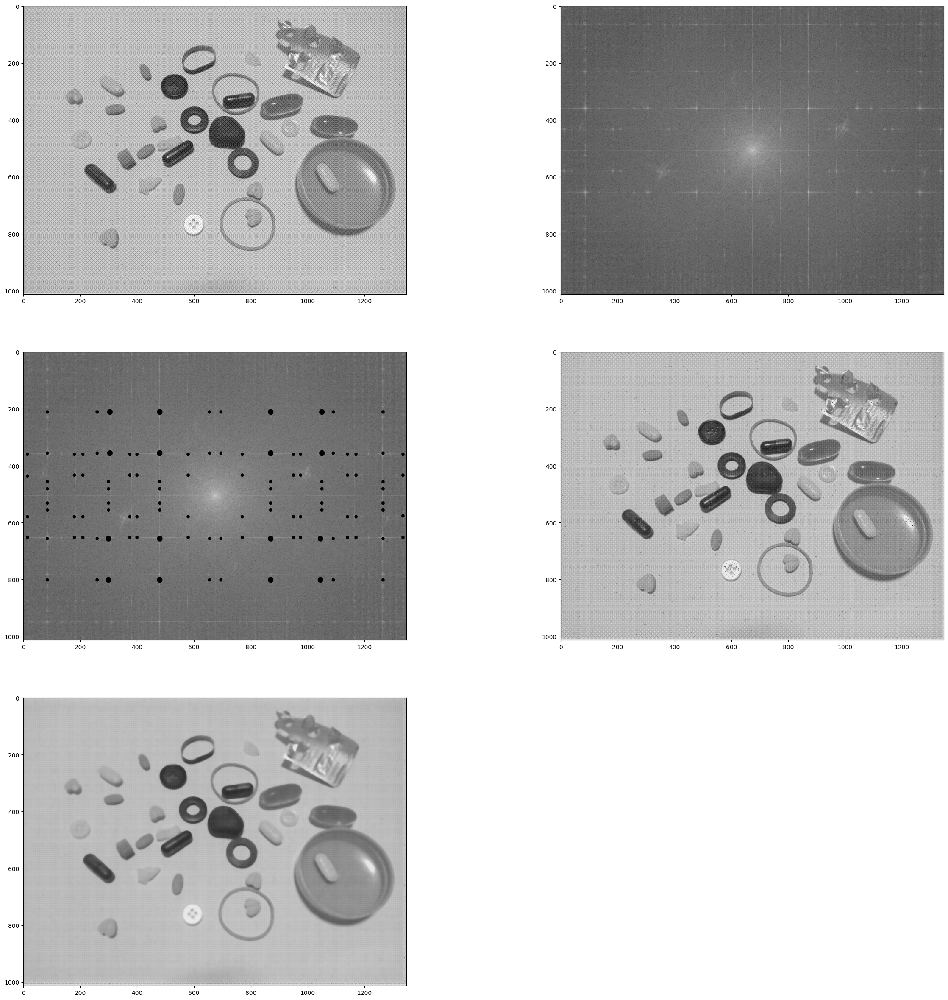

In [83]:
G = rgb[:,:,1]
f=np.fft.fft2(G)
fshift=np.fft.fftshift(f)
magnitude_spectrum=20*np.log(abs(fshift))
#################################

#################################
Gx = G.shape

H1=notched_rejected(Gx,10,150,195)
H2=notched_rejected(Gx,10,150,-195)
H3=notched_rejected(Gx,10,150,370)
H4=notched_rejected(Gx,10,150,-375)
H5=notched_rejected(Gx,6,150,415)
H6=notched_rejected(Gx,6,150,-415)
H7=notched_rejected(Gx,6,150,590)
H8=notched_rejected(Gx,6,150,-590)
H9=notched_rejected(Gx,6,70,660)
H10=notched_rejected(Gx,6,73,-660)
H11=notched_rejected(Gx,6,73,95)
H12=notched_rejected(Gx,6,73,-95)
H13=notched_rejected(Gx,6,73,300)
H14=notched_rejected(Gx,6,73,-300)
H15=notched_rejected(Gx,6,73,495)
H16=notched_rejected(Gx,6,73,-495)
H17=notched_rejected(Gx,6,73,465)
H18=notched_rejected(Gx,6,73,-465)
H19=notched_rejected(Gx,6,150,20)
H20=notched_rejected(Gx,6,150,-20)
H21=notched_rejected(Gx,6,73,275)
H22=notched_rejected(Gx,6,73,-275)
H23=notched_rejected(Gx,6,25,590)
H24=notched_rejected(Gx,6,25,-590)
H25=notched_rejected(Gx,6,25,195)
H26=notched_rejected(Gx,6,25,-195)
H27=notched_rejected(Gx,6,25,375)
H28=notched_rejected(Gx,6,25,-375)
###################################
H29=notched_rejected(Gx,10,295,195)
H30=notched_rejected(Gx,10,295,-195)
H31=notched_rejected(Gx,10,295,370)
H32=notched_rejected(Gx,10,295,-375)
H33=notched_rejected(Gx,6,295,415)
H34=notched_rejected(Gx,6,295,-415)
H35=notched_rejected(Gx,6,295,590)
H36=notched_rejected(Gx,6,295,-590)
H37=notched_rejected(Gx,6,146,660)
H38=notched_rejected(Gx,6,146,-660)
H39=notched_rejected(Gx,6,146,95)
H40=notched_rejected(Gx,6,146,-95)
H41=notched_rejected(Gx,6,146,300)
H42=notched_rejected(Gx,6,146,-300)
H43=notched_rejected(Gx,6,146,495)
H44=notched_rejected(Gx,6,146,-495)
H45=notched_rejected(Gx,6,146,465)
H46=notched_rejected(Gx,6,146,-465)
H47=notched_rejected(Gx,6,295,20)
H48=notched_rejected(Gx,6,295,-20)
H49=notched_rejected(Gx,6,146,275)
H50=notched_rejected(Gx,6,146,-275)
H51=notched_rejected(Gx,6,50,590)
H52=notched_rejected(Gx,6,50,-590)
H53=notched_rejected(Gx,6,50,195)
H54=notched_rejected(Gx,6,50,-195)
H55=notched_rejected(Gx,6,50,375)
H56=notched_rejected(Gx,6,50,-375)

notch_filter=H1*H2*H3*H4*H5*H6*H7*H8*H9*H10*H11*H12*H13*H14*H15*H16*H17*H18*H19*H20*H21*H22*H23*H24*H25*H26*H27*H28*H29*H30*H31*H32*H33*H34*H35*H36*H37*H38*H39*H40*H41*H42*H43*H44*H45*H46*H47*H48*H49*H50*H51*H52*H53*H54*H55*H56
notched_rejected_center=fshift*notch_filter 
notch_re=np.fft.ifftshift(notched_rejected_center)

inverse_notch=np.fft.ifft2(notch_re)

result_G = np.abs(inverse_notch).astype(np.uint8)
######################################
median_img_G=median_filter(result_G,10)
######################################

fig=plt.figure(figsize=(30,30))
plt.subplot(321)
plt.imshow(G,'gray')

plt.subplot(322)
plt.imshow(magnitude_spectrum,'gray')

plt.subplot(323)
plt.imshow(magnitude_spectrum*notch_filter,'gray')

plt.subplot(324)
plt.imshow(result_G,'gray')

plt.subplot(325)
plt.imshow(median_img_G,'gray')

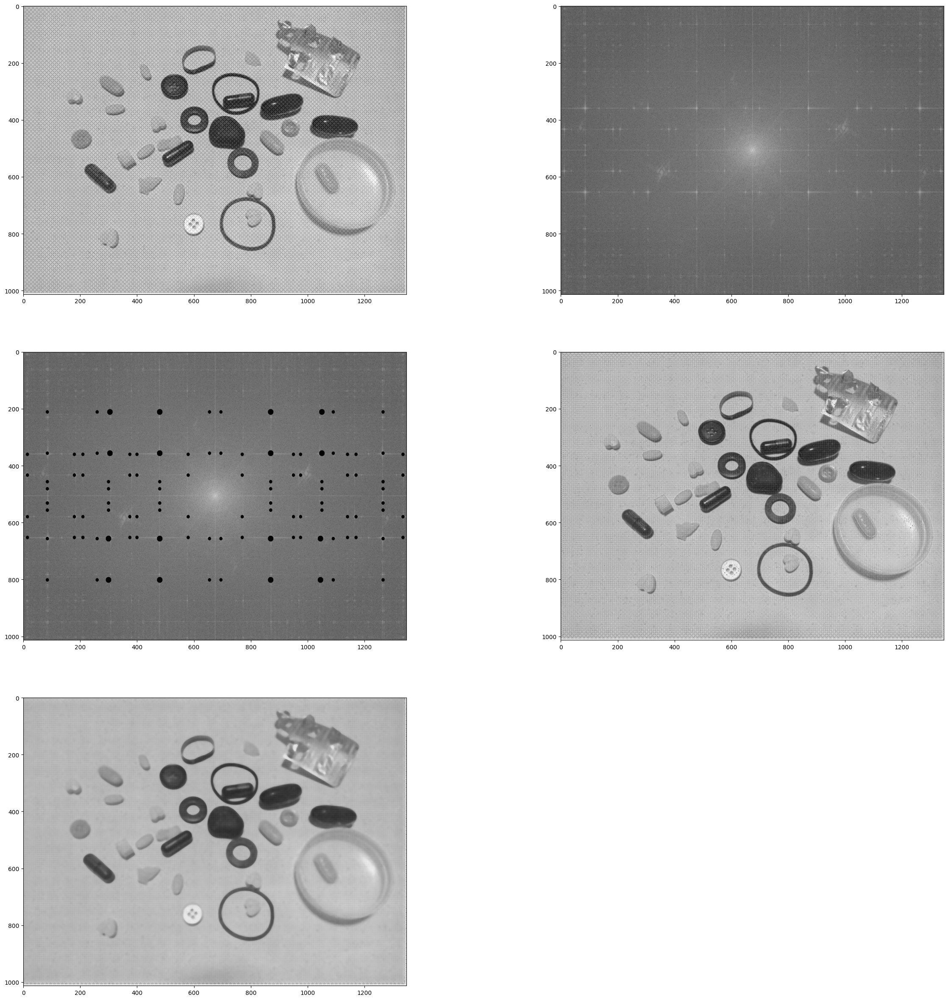

In [84]:
B = rgb[:,:,2]
f=np.fft.fft2(B)
fshift=np.fft.fftshift(f)
magnitude_spectrum=20*np.log(abs(fshift))
#################################

#################################
Bx = B.shape

H1=notched_rejected(Bx,10,150,195)
H2=notched_rejected(Bx,10,150,-195)
H3=notched_rejected(Bx,10,150,370)
H4=notched_rejected(Bx,10,150,-375)
H5=notched_rejected(Bx,6,150,415)
H6=notched_rejected(Bx,6,150,-415)
H7=notched_rejected(Bx,6,150,590)
H8=notched_rejected(Bx,6,150,-590)
H9=notched_rejected(Bx,6,73,660)
H10=notched_rejected(Bx,6,73,-660)
H11=notched_rejected(Bx,6,73,95)
H12=notched_rejected(Bx,6,73,-95)
H13=notched_rejected(Bx,6,73,300)
H14=notched_rejected(Bx,6,73,-300)
H15=notched_rejected(Bx,6,73,495)
H16=notched_rejected(Bx,6,73,-495)
H17=notched_rejected(Bx,6,73,465)
H18=notched_rejected(Bx,6,73,-465)
H19=notched_rejected(Bx,6,150,20)
H20=notched_rejected(Bx,6,150,-20)
H21=notched_rejected(Bx,6,73,275)
H22=notched_rejected(Bx,6,73,-275)
H23=notched_rejected(Bx,6,25,590)
H24=notched_rejected(Bx,6,25,-590)
H25=notched_rejected(Bx,6,25,195)
H26=notched_rejected(Bx,6,25,-195)
H27=notched_rejected(Bx,6,25,375)
H28=notched_rejected(Bx,6,25,-375)
###################################
H29=notched_rejected(Bx,10,295,195)
H30=notched_rejected(Bx,10,295,-195)
H31=notched_rejected(Bx,10,295,370)
H32=notched_rejected(Bx,10,295,-375)
H33=notched_rejected(Bx,6,295,415)
H34=notched_rejected(Bx,6,295,-415)
H35=notched_rejected(Bx,6,295,590)
H36=notched_rejected(Bx,6,295,-590)
H37=notched_rejected(Bx,6,146,660)
H38=notched_rejected(Bx,6,146,-660)
H39=notched_rejected(Bx,6,146,95)
H40=notched_rejected(Bx,6,146,-95)
H41=notched_rejected(Bx,6,146,300)
H42=notched_rejected(Bx,6,146,-300)
H43=notched_rejected(Bx,6,146,495)
H44=notched_rejected(Bx,6,146,-495)
H45=notched_rejected(Bx,6,146,465)
H46=notched_rejected(Bx,6,146,-465)
H47=notched_rejected(Bx,6,295,20)
H48=notched_rejected(Bx,6,295,-20)
H49=notched_rejected(Bx,6,146,275)
H50=notched_rejected(Bx,6,146,-275)
H51=notched_rejected(Bx,6,50,590)
H52=notched_rejected(Bx,6,50,-590)
H53=notched_rejected(Bx,6,50,195)
H54=notched_rejected(Bx,6,50,-195)
H55=notched_rejected(Bx,6,50,375)
H56=notched_rejected(Bx,6,50,-375)

notch_filter=H1*H2*H3*H4*H5*H6*H7*H8*H9*H10*H11*H12*H13*H14*H15*H16*H17*H18*H19*H20*H21*H22*H23*H24*H25*H26*H27*H28*H29*H30*H31*H32*H33*H34*H35*H36*H37*H38*H39*H40*H41*H42*H43*H44*H45*H46*H47*H48*H49*H50*H51*H52*H53*H54*H55*H56
notched_rejected_center=fshift*notch_filter 
notch_re=np.fft.ifftshift(notched_rejected_center)

inverse_notch=np.fft.ifft2(notch_re)

result_B = np.abs(inverse_notch).astype(np.uint8)
######################################
median_img_B=median_filter(result_B,10)
######################################

fig=plt.figure(figsize=(30,30))
plt.subplot(321)
plt.imshow(B,'gray')

plt.subplot(322)
plt.imshow(magnitude_spectrum,'gray')

plt.subplot(323)
plt.imshow(magnitude_spectrum*notch_filter,'gray')

plt.subplot(324)
plt.imshow(result_B,'gray')

plt.subplot(325)
plt.imshow(median_img_B,'gray')


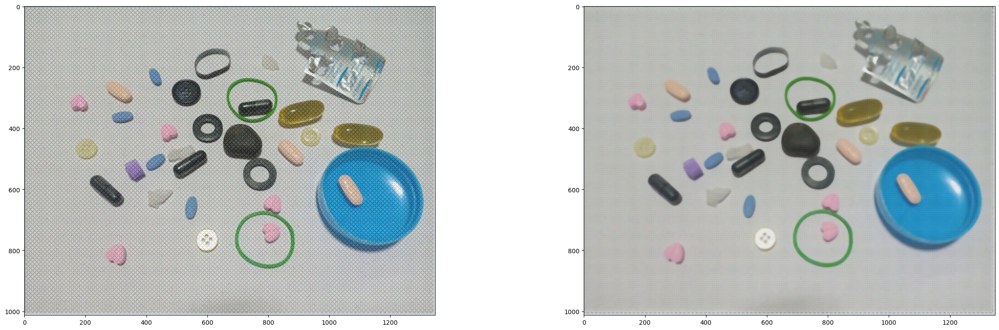

In [85]:
merge_img = cv2.merge([median_img_R,median_img_G,median_img_B])

fig=plt.figure(figsize=(30,20))
plt.subplot(221)
plt.imshow(rgb)

plt.subplot(222)
plt.imshow(merge_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[ 0  1  0]
 [ 1 -4  1]
 [ 0  1  0]]


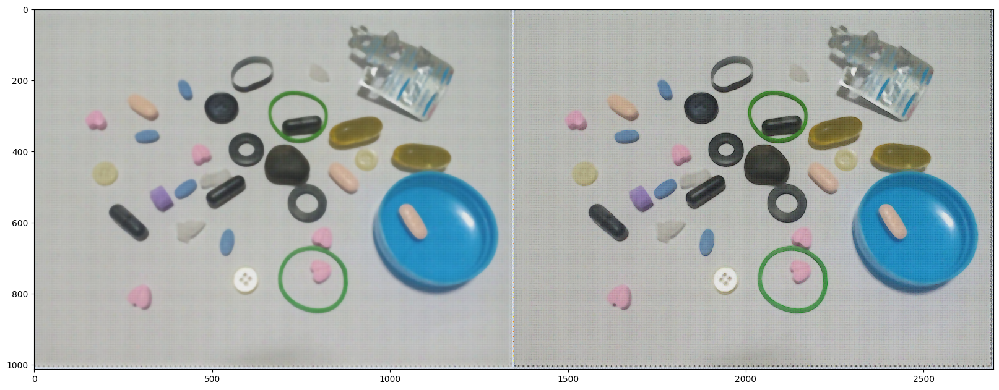

In [88]:
laplacian_kernel=np.array([[0,1,0],
                        [1,-4,1],
                        [0,1,0]])

# laplacian_kernel2=np.array([[0,-1,0],
#                             [-1,4,-1],
#                             [0,-1,0]])

laplacian_img=cv2.filter2D(merge_img,-1,laplacian_kernel)
img=merge_img+((-3*laplacian_img).astype(int))
output=np.hstack((merge_img,img))

print(laplacian_kernel)

fig=plt.figure(figsize=(20,20))
plt.imshow(output)